# THE BATTLE OF AMSTERDAM

In this proejct ......

The following sources have been used

All is written with Python 3.0 using IBM Watson Studio.

-------------------------------------------

Import libraries

In [2]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

# tranforming json file into a pandas dataframe library
from pandas.io.json import json_normalize

from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt


# import k-means from clustering stage
from sklearn.cluster import KMeans

# importing CSV file from Watson dirctory
import types
from botocore.client import Config
import ibm_boto3

# libraries for displaying images
from IPython.display import Image 
from IPython.core.display import HTML 


from bs4 import BeautifulSoup # import recommended html parsing library

print('Libraries imported.')

Libraries imported.


Install visualization library

In [3]:
!conda install -c conda-forge geopy --yes 
!conda install -c conda-forge folium=0.5.0 --yes 
import folium # map rendering library

Fetching package metadata .............
Solving package specifications: .

Package plan for installation in environment /opt/conda/envs/DSX-Python35:

The following NEW packages will be INSTALLED:

    geographiclib: 1.49-py_0   conda-forge
    geopy:         1.19.0-py_0 conda-forge

geographiclib- 100% |################################| Time: 0:00:00  24.48 MB/s
geopy-1.19.0-p 100% |################################| Time: 0:00:00  36.44 MB/s
Fetching package metadata .............
Solving package specifications: .

Package plan for installation in environment /opt/conda/envs/DSX-Python35:

The following NEW packages will be INSTALLED:

    altair:  2.2.2-py35_1 conda-forge
    branca:  0.3.1-py_0   conda-forge
    folium:  0.5.0-py_0   conda-forge
    vincent: 0.4.4-py_1   conda-forge

altair-2.2.2-p 100% |################################| Time: 0:00:00  52.72 MB/s
branca-0.3.1-p 100% |################################| Time: 0:00:00  35.88 MB/s
vincent-0.4.4- 100% |###################

Download Data set from Kaggle:
https://www.kaggle.com/erikbruin/airbnb-amsterdam#listings_details.csv
    

In [4]:
# The code was removed by Watson Studio for sharing.

/opt/conda/envs/DSX-Python35/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2698: DtypeWarning: Columns (87) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,2818,https://www.airbnb.com/rooms/2818,20181206172549,2018-12-06,Quiet Garden View Room & Super Fast WiFi,Quiet Garden View Room & Super Fast WiFi,I'm renting a bedroom (room overlooking the ga...,Quiet Garden View Room & Super Fast WiFi I'm r...,none,"Indische Buurt (""Indies Neighborhood"") is a ne...",From week 38 to week 47 maintenance work to th...,The neighbourhood is well served by 24 hours p...,NaN,NaN,Please: - Leave your shoes in the entrance - ...,NaN,NaN,https://a0.muscache.com/im/pictures/10272854/8...,NaN,3159,https://www.airbnb.com/users/show/3159,Daniel,2008-09-24,"Amsterdam, Noord-Holland, The Netherlands","Upon arriving in Amsterdam, one can imagine as...",within an hour,100%,NaN,t,https://a0.muscache.com/im/users/3159/profile_...,https://a0.muscache.com/im/users/3159/profile_...,Indische Buurt,1.0,1.0,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,f,"Amsterdam, North Holland, Netherlands",Indische Buurt,Oostelijk Havengebied - Indische Buurt,NaN,Amsterdam,North Holland,NaN,Amsterdam,"Amsterdam, Netherlands",NL,Netherlands,52.365755,4.941419,f,Apartment,Private room,2,1.5,1.0,2.0,Real Bed,"{Internet,Wifi,""Paid parking off premises"",""Bu...",NaN,$59.00,NaN,"$1,500.00",$100.00,$50.00,1,$20.00,3,15,today,t,17,44,44,44,2018-12-06,248,2009-03-30,2018-11-28,97.0,10.0,10.0,10.0,10.0,9.0,10.0,f,NaN,{Amsterdam},t,f,strict_14_with_grace_period,f,f,1,2.10
1,3209,https://www.airbnb.com/rooms/3209,20181206172549,2018-12-06,"Quiet apt near center, great view",You will love our spacious (90 m2) bright apar...,"Our apartment has lots of light, a balcony and...",You will love our spacious (90 m2) bright apar...,none,Welcome to the Spaarndammerbuurt! From the beg...,NaN,"From Central Station, walk towards the busstop...",You will have the entire house to yourself.,We will meet you in person for check in whenev...,"Our house comes with our very sweet, but old (...",NaN,NaN,https://a0.muscache.com/im/pictures/88955424/4...,NaN,3806,https://www.airbnb.com/users/show/3806,Maartje,2008-10-24,"Amsterdam, Noord-Holland, The Netherlands",I am a freelance radio producer and journalist...,within an hour,100%,NaN,f,https://a0.muscache.com/im/users/3806/profile_...,https://a0.muscache.com/im/users/3806/profile_...,Spaarndammer en Zeeheldenbuurt,1.0,1.0,"['email', 'phone', 'reviews', 'jumio']",t,t,"Amsterdam, Noord-Holland, Netherlands",Spaarndammer en Zeeheldenbuurt,Westerpark,NaN,Amsterdam,Noord-Holland,1013 XE,Amsterdam,"Amsterdam, Netherlands",NL,Netherlands,52.390225,4.873924,t,Apartment,Entire home/apt,5,1.

In [5]:
print(df_data_1.columns)

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'summary',
       'space', 'description', 'experiences_offered', 'neighborhood_overview',
       'notes', 'transit', 'access', 'interaction', 'house_rules',
       'thumbnail_url', 'medium_url', 'picture_url', 'xl_picture_url',
       'host_id', 'host_url', 'host_name', 'host_since', 'host_location',
       'host_about', 'host_response_time', 'host_response_rate',
       'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url',
       'host_picture_url', 'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'street',
       'neighbourhood', 'neighbourhood_cleansed',
       'neighbourhood_group_cleansed', 'city', 'state', 'zipcode', 'market',
       'smart_location', 'country_code', 'country', 'latitude', 'longitude',
       'is_location_exact', 'property_type', 'room_type', 'accommodates',
       'bathrooms',

In [6]:
df_data_1.head(3)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,2818,https://www.airbnb.com/rooms/2818,20181206172549,2018-12-06,Quiet Garden View Room & Super Fast WiFi,Quiet Garden View Room & Super Fast WiFi,I'm renting a bedroom (room overlooking the ga...,Quiet Garden View Room & Super Fast WiFi I'm r...,none,"Indische Buurt (""Indies Neighborhood"") is a ne...",From week 38 to week 47 maintenance work to th...,The neighbourhood is well served by 24 hours p...,NaN,NaN,Please: - Leave your shoes in the entrance - ...,NaN,NaN,https://a0.muscache.com/im/pictures/10272854/8...,NaN,3159,https://www.airbnb.com/users/show/3159,Daniel,2008-09-24,"Amsterdam, Noord-Holland, The Netherlands","Upon arriving in Amsterdam, one can imagine as...",within an hour,100%,NaN,t,https://a0.muscache.com/im/users/3159/profile_...,https://a0.muscache.com/im/users/3159/profile_...,Indische Buurt,1.0,1.0,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,f,"Amsterdam, North Holland, Netherlands",Indische Buurt,Oostelijk Havengebied - Indische Buurt,NaN,Amsterdam,North Holland,NaN,Amsterdam,"Amsterdam, Netherlands",NL,Netherlands,52.365755,4.941419,f,Apartment,Private room,2,1.5,1.0,2.0,Real Bed,"{Internet,Wifi,""Paid parking off premises"",""Bu...",NaN,$59.00,NaN,"$1,500.00",$100.00,$50.00,1,$20.00,3,15,today,t,17,44,44,44,2018-12-06,248,2009-03-30,2018-11-28,97.0,10.0,10.0,10.0,10.0,9.0,10.0,f,NaN,{Amsterdam},t,f,strict_14_with_grace_period,f,f,1,2.10
1,3209,https://www.airbnb.com/rooms/3209,20181206172549,2018-12-06,"Quiet apt near center, great view",You will love our spacious (90 m2) bright apar...,"Our apartment has lots of light, a balcony and...",You will love our spacious (90 m2) bright apar...,none,Welcome to the Spaarndammerbuurt! From the beg...,NaN,"From Central Station, walk towards the busstop...",You will have the entire house to yourself.,We will meet you in person for check in whenev...,"Our house comes with our very sweet, but old (...",NaN,NaN,https://a0.muscache.com/im/pictures/88955424/4...,NaN,3806,https://www.airbnb.com/users/show/3806,Maartje,2008-10-24,"Amsterdam, Noord-Holland, The Netherlands",I am a freelance radio producer and journalist...,within an hour,100%,NaN,f,https://a0.muscache.com/im/users/3806/profile_...,https://a0.muscache.com/im/users/3806/profile_...,Spaarndammer en Zeeheldenbuurt,1.0,1.0,"['email', 'phone', 'reviews', 'jumio']",t,t,"Amsterdam, Noord-Holland, Netherlands",Spaarndammer en Zeeheldenbuurt,Westerpark,NaN,Amsterdam,Noord-Holland,1013 XE,Amsterdam,"Amsterdam, Netherlands",NL,Netherlands,52.390225,4.873924,t,Apartment,Entire home/apt,5,1.

In [7]:
missing_data = df_data_1.isnull()
for column in missing_data.columns.values.tolist():
    print(column)
    print (missing_data[column].value_counts())
    print("") 

id
False    20030
Name: id, dtype: int64

listing_url
False    20030
Name: listing_url, dtype: int64

scrape_id
False    20030
Name: scrape_id, dtype: int64

last_scraped
False    20030
Name: last_scraped, dtype: int64

name
False    19992
True        38
Name: name, dtype: int64

summary
False    19510
True       520
Name: summary, dtype: int64

space
False    14579
True      5451
Name: space, dtype: int64

description
False    19906
True       124
Name: description, dtype: int64

experiences_offered
False    20030
Name: experiences_offered, dtype: int64

neighborhood_overview
False    13257
True      6773
Name: neighborhood_overview, dtype: int64

notes
True     10999
False     9031
Name: notes, dtype: int64

transit
False    13635
True      6395
Name: transit, dtype: int64

access
False    12227
True      7803
Name: access, dtype: int64

interaction
False    11974
True      8056
Name: interaction, dtype: int64

house_rules
False    12571
True      7459
Name: house_rules, dtype: int64

In [8]:
df_Airbnb=df_data_1

In [9]:
df_Airbnb.head(3)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,2818,https://www.airbnb.com/rooms/2818,20181206172549,2018-12-06,Quiet Garden View Room & Super Fast WiFi,Quiet Garden View Room & Super Fast WiFi,I'm renting a bedroom (room overlooking the ga...,Quiet Garden View Room & Super Fast WiFi I'm r...,none,"Indische Buurt (""Indies Neighborhood"") is a ne...",From week 38 to week 47 maintenance work to th...,The neighbourhood is well served by 24 hours p...,NaN,NaN,Please: - Leave your shoes in the entrance - ...,NaN,NaN,https://a0.muscache.com/im/pictures/10272854/8...,NaN,3159,https://www.airbnb.com/users/show/3159,Daniel,2008-09-24,"Amsterdam, Noord-Holland, The Netherlands","Upon arriving in Amsterdam, one can imagine as...",within an hour,100%,NaN,t,https://a0.muscache.com/im/users/3159/profile_...,https://a0.muscache.com/im/users/3159/profile_...,Indische Buurt,1.0,1.0,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,f,"Amsterdam, North Holland, Netherlands",Indische Buurt,Oostelijk Havengebied - Indische Buurt,NaN,Amsterdam,North Holland,NaN,Amsterdam,"Amsterdam, Netherlands",NL,Netherlands,52.365755,4.941419,f,Apartment,Private room,2,1.5,1.0,2.0,Real Bed,"{Internet,Wifi,""Paid parking off premises"",""Bu...",NaN,$59.00,NaN,"$1,500.00",$100.00,$50.00,1,$20.00,3,15,today,t,17,44,44,44,2018-12-06,248,2009-03-30,2018-11-28,97.0,10.0,10.0,10.0,10.0,9.0,10.0,f,NaN,{Amsterdam},t,f,strict_14_with_grace_period,f,f,1,2.10
1,3209,https://www.airbnb.com/rooms/3209,20181206172549,2018-12-06,"Quiet apt near center, great view",You will love our spacious (90 m2) bright apar...,"Our apartment has lots of light, a balcony and...",You will love our spacious (90 m2) bright apar...,none,Welcome to the Spaarndammerbuurt! From the beg...,NaN,"From Central Station, walk towards the busstop...",You will have the entire house to yourself.,We will meet you in person for check in whenev...,"Our house comes with our very sweet, but old (...",NaN,NaN,https://a0.muscache.com/im/pictures/88955424/4...,NaN,3806,https://www.airbnb.com/users/show/3806,Maartje,2008-10-24,"Amsterdam, Noord-Holland, The Netherlands",I am a freelance radio producer and journalist...,within an hour,100%,NaN,f,https://a0.muscache.com/im/users/3806/profile_...,https://a0.muscache.com/im/users/3806/profile_...,Spaarndammer en Zeeheldenbuurt,1.0,1.0,"['email', 'phone', 'reviews', 'jumio']",t,t,"Amsterdam, Noord-Holland, Netherlands",Spaarndammer en Zeeheldenbuurt,Westerpark,NaN,Amsterdam,Noord-Holland,1013 XE,Amsterdam,"Amsterdam, Netherlands",NL,Netherlands,52.390225,4.873924,t,Apartment,Entire home/apt,5,1.

In [10]:
df_Airbnb = df_Airbnb.drop('listing_url',1).drop('scrape_id',1).drop('last_scraped',1).drop('summary',1).drop('space',1).drop('description',1).drop('experiences_offered',1).drop('neighborhood_overview',1).drop('notes',1).drop('transit',1).drop('access',1).drop('interaction',1).drop('house_rules',1).drop('thumbnail_url',1).drop('medium_url',1).drop('picture_url',1).drop('xl_picture_url',1).drop('host_id',1).drop('host_url',1).drop('host_name',1).drop('host_since',1).drop('host_location',1).drop('host_about',1).drop('host_response_time',1).drop('host_response_rate',1).drop('host_acceptance_rate',1).drop('host_is_superhost',1).drop('host_thumbnail_url',1).drop('host_picture_url',1).drop('host_listings_count',1).drop('host_total_listings_count',1).drop('host_verifications',1).drop('host_has_profile_pic',1).drop('host_identity_verified',1).drop('street',1).drop('neighbourhood_group_cleansed',1).drop('city',1).drop('state',1).drop('zipcode',1).drop('market',1).drop('smart_location',1).drop('country_code',1).drop('country',1).drop('is_location_exact',1).drop('bed_type',1).drop('amenities',1).drop('square_feet',1).drop('weekly_price',1).drop('monthly_price',1).drop('security_deposit',1).drop('guests_included',1).drop('extra_people',1).drop('minimum_nights',1).drop('maximum_nights',1).drop('calendar_updated',1).drop('has_availability',1).drop('availability_30',1).drop('availability_60',1).drop('availability_90',1).drop('availability_365',1).drop('calendar_last_scraped',1).drop('number_of_reviews',1).drop('first_review',1).drop('last_review',1).drop('review_scores_accuracy',1).drop('review_scores_cleanliness',1).drop('review_scores_checkin',1).drop('review_scores_communication',1).drop('review_scores_value',1).drop('requires_license',1).drop('license',1).drop('jurisdiction_names',1).drop('instant_bookable',1).drop('is_business_travel_ready',1).drop('cancellation_policy',1).drop('require_guest_profile_picture',1).drop('require_guest_phone_verification',1).drop('calculated_host_listings_count',1).drop('reviews_per_month',1).drop('host_neighbourhood',1)

In [11]:
df_Airbnb.head(3)

,id,name,neighbourhood,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,price,cleaning_fee,review_scores_rating,review_scores_location
0,2818,Quiet Garden View Room & Super Fast WiFi,Indische Buurt,Oostelijk Havengebied - Indische Buurt,52.365755,4.941419,Apartment,Private room,2,1.5,1.0,2.0,$59.00,$50.00,97.0,9.0
1,3209,"Quiet apt near center, great view",Spaarndammer en Zeeheldenbuurt,Westerpark,52.390225,4.873924,Apartment,Entire home/apt,5,1.0,2.0,2.0,$160.00,$40.00,96.0,9.0
2,20168,100%Centre-Studio 1 Private Floor/Bathroom,Grachtengordel,Centrum-Oost,52.365087,4.893541,Townhouse,Entire home/apt,2,1.0,1.0,1.0,$80.00,NaN,87.0,10.0


In [12]:
df_Airbnb = df_Airbnb.reset_index(drop=True)

In [13]:
df_Airbnb.shape

(20030, 16)

In [14]:
missing_data_2 = df_Airbnb.isnull()
for column in missing_data.columns.values.tolist():
    print(column)
    print (missing_data[column].value_counts())
    print("") 

id
False    20030
Name: id, dtype: int64

listing_url
False    20030
Name: listing_url, dtype: int64

scrape_id
False    20030
Name: scrape_id, dtype: int64

last_scraped
False    20030
Name: last_scraped, dtype: int64

name
False    19992
True        38
Name: name, dtype: int64

summary
False    19510
True       520
Name: summary, dtype: int64

space
False    14579
True      5451
Name: space, dtype: int64

description
False    19906
True       124
Name: description, dtype: int64

experiences_offered
False    20030
Name: experiences_offered, dtype: int64

neighborhood_overview
False    13257
True      6773
Name: neighborhood_overview, dtype: int64

notes
True     10999
False     9031
Name: notes, dtype: int64

transit
False    13635
True      6395
Name: transit, dtype: int64

access
False    12227
True      7803
Name: access, dtype: int64

interaction
False    11974
True      8056
Name: interaction, dtype: int64

house_rules
False    12571
True      7459
Name: house_rules, dtype: int64

In [15]:
df_Airbnb.dropna (axis=0, inplace = True)

In [16]:
df_Airbnb.reset_index(drop=True, inplace=True)

In [17]:
df_Airbnb.shape

(13412, 16)

In [18]:
filtered_columns = ['id', 'neighbourhood','neighbourhood_cleansed', 'latitude', 'longitude']
df_AirLocations = df_Airbnb.loc[:, filtered_columns]
df_AirLocations.head(3)

,id,neighbourhood,neighbourhood_cleansed,latitude,longitude
0,2818,Indische Buurt,Oostelijk Havengebied - Indische Buurt,52.365755,4.941419
1,3209,Spaarndammer en Zeeheldenbuurt,Westerpark,52.390225,4.873924
2,25428,Grachtengordel,Centrum-West,52.373114,4.883668


In [19]:
df_AirLocations.shape

(13412, 5)

Get geographical coordinates of Rijksmusem Amsterdam

In [64]:
address = 'Museumstraat 1, 1071 XX Amsterdam, Netherlands'

geolocator = Nominatim(user_agent="foursquare_agent")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print(latitude, longitude)

52.3596306 4.8847566


In [65]:
venues_map = folium.Map(location=[latitude, longitude], zoom_start=15) # generate map centred around Rijksmuseum

In [66]:
# add a red circle marker to represent the Rijksmuseum
folium.features.CircleMarker(
    [latitude, longitude],
    radius=10,
    color='red',
    popup='Rijksmuseum',
    fill = True,
    fill_color = 'red',
    fill_opacity = 0.6
).add_to(venues_map)

In [67]:
venues_map

In [22]:
df_Neighborhoods = df_AirLocations
df_Neighborhoods.groupby('neighbourhood').count()

,id,neighbourhood_cleansed,latitude,longitude
neighbourhood,,,,
Amsterdam Centrum,286,286,286,286
Banne Buiksloot,61,61,61,61
Bos en Lommer,793,793,793,793
Buiksloterham,72,72,72,72
Buikslotermeer,78,78,78,78
Buitenveldert-Oost,36,36,36,36
Buitenveldert-West,103,103,103,103
De Pijp,1262,1262,1262,1262
De Wallen,199,199,199,199


Sort the Neighbothoods by number of IDs (read=Airbnb locations). 

In [23]:
df_Neighborhoods.groupby(['neighbourhood']).size().reset_index(name='counts').sort_values(by='counts', ascending=False)

,neighbourhood,counts
27,Oud-West,2984
7,De Pijp,1262
2,Bos en Lommer,793
10,Grachtengordel,790
13,Indische Buurt,678
14,Jordaan,671
24,Oosterparkbuurt,659
30,Rivierenbuurt,467
22,Oost,384
11,Hoofddorppleinbuurt,300


TopNeighborhoods are the 10 neighborhoods with the most Airbnb locations

In [24]:
Selected_NH = ['Oud-West','De Pijp', 'Bos en Lommer', 'Grachtengordel','Indische Buurt','Jordaan','Oosterparkbuurt','Rivierenbuurt','Oost','Hoofddorppleinbuurt']
df_TopNeighborhoods = df_Neighborhoods[df_Neighborhoods.neighbourhood.isin(Selected_NH)]
df_TopNeighborhoods.head(10)

,id,neighbourhood,neighbourhood_cleansed,latitude,longitude
0,2818,Indische Buurt,Oostelijk Havengebied - Indische Buurt,52.365755,4.941419
2,25428,Grachtengordel,Centrum-West,52.373114,4.883668
4,28658,Bos en Lommer,Bos en Lommer,52.375342,4.857289
5,31080,Hoofddorppleinbuurt,Zuid,52.351321,4.848383
8,44129,Jordaan,Centrum-West,52.380711,4.886104
10,46386,De Pijp,De Pijp - Rivierenbuurt,52.352470,4.908254
11,48076,Grachtengordel,Centrum-West,52.380420,4.894535
12,50515,Bos en Lommer,Bos en Lommer,52.377272,4.839253
13,50518,Oud-West,Westerpark,52.382006,4.878650
14,50570,Bos en Lommer,Bos en Lommer,52.377737,4.848912


In [43]:
df_TopNeighborhoods.shape

(8988, 5)

Group neighborhoods by average review score, averate location. Which neightborhoods are in the top 10?

In [55]:
filtered_columns_2 = ['id','neighbourhood','review_scores_rating','review_scores_location','latitude','longitude']
df_AirReview = df_Airbnb.loc[:, filtered_columns_2]
df_AirReview.head(3)

,id,neighbourhood,review_scores_rating,review_scores_location,latitude,longitude
0,2818,Indische Buurt,97.0,9.0,52.365755,4.941419
1,3209,Spaarndammer en Zeeheldenbuurt,96.0,9.0,52.390225,4.873924
2,25428,Grachtengordel,100.0,10.0,52.373114,4.883668


In [56]:
df_AirReview['review_scores_rating']=df_AirReview['review_scores_rating']*0.1
df_AirReview.head(3)

,id,neighbourhood,review_scores_rating,review_scores_location,latitude,longitude
0,2818,Indische Buurt,9.7,9.0,52.365755,4.941419
1,3209,Spaarndammer en Zeeheldenbuurt,9.6,9.0,52.390225,4.873924
2,25428,Grachtengordel,10.0,10.0,52.373114,4.883668


In [57]:
df_AirReview.groupby('neighbourhood', as_index=False).agg({"review_scores_rating":"mean"}).sort_values(by='review_scores_rating', ascending=False)

,neighbourhood,review_scores_rating
15,Kadoelen,9.675758
35,Stadionbuurt,9.633333
25,Oostzanerwerf,9.580645
17,Museumkwartier,9.579091
11,Hoofddorppleinbuurt,9.570667
22,Oost,9.570312
33,Slotervaart,9.567232
23,Oostelijke Eilanden en Kadijken,9.563874
40,Watergraafsmeer,9.558242
27,Oud-West,9.549263


In [58]:
df_AirReview.groupby('neighbourhood', as_index=False).agg({"review_scores_location":"mean"}).sort_values(by='review_scores_location', ascending=False)

,neighbourhood,review_scores_location
0,Amsterdam Centrum,9.958042
10,Grachtengordel,9.922785
8,De Wallen,9.899497
14,Jordaan,9.882265
21,Nieuwmarkt en Lastage,9.872807
17,Museumkwartier,9.872727
42,Westelijke Eilanden,9.830601
7,De Pijp,9.759113
41,Weesperbuurt en Plantage,9.692308
9,Frederik Hendrikbuurt,9.553691


Scatter plot to see correlation between Review Score Rating and Review Scores Location

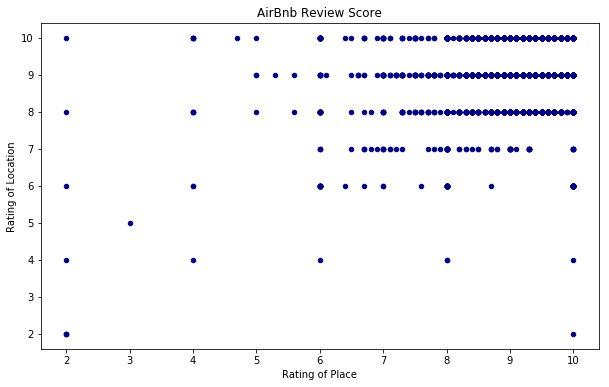

In [71]:
df_AirReview.plot(kind='scatter', x='review_scores_rating', y='review_scores_location', figsize=(10, 6), color='darkblue')

plt.title('AirBnb Review Score')
plt.xlabel('Rating of Place')
plt.ylabel('Rating of Location')

plt.show()


In [72]:
x = df_AirReview['review_scores_rating']      # year on x-axis
y = df_AirReview['review_scores_location']     # total on y-axis
fit = np.polyfit(x, y, deg=1)
fit


array([ 0.38236234,  5.8116432 ])

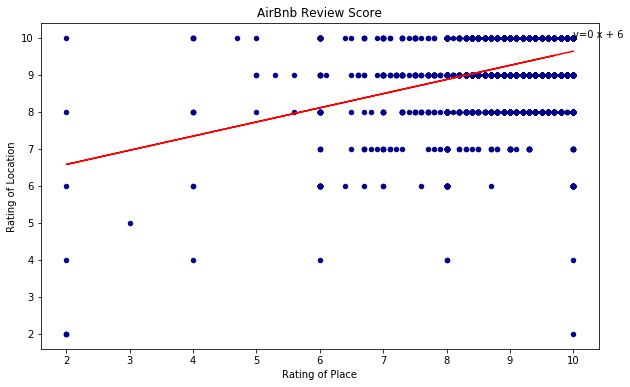

In [73]:
df_AirReview.plot(kind='scatter', x='review_scores_rating', y='review_scores_location', figsize=(10, 6), color='darkblue')

plt.title('AirBnb Review Score')
plt.xlabel('Rating of Place')
plt.ylabel('Rating of Location')

# plot line of best fit
plt.plot(x, fit[0] * x + fit[1], color='red') # recall that x is the Place
plt.annotate('y={0:.0f} x + {1:.0f}'.format(fit[0], fit[1]), xy=(10, 10))

plt.show()



Add both columns together and divide by two. This way one score based on overall rating and location. Column called 'Review_overal_scores'

In [59]:
df_AirReview['Review_overal_scores']=(df_AirReview['review_scores_rating']+df_AirReview['review_scores_location'])/2
df_AirReview.head(3)

,id,neighbourhood,review_scores_rating,review_scores_location,latitude,longitude,Review_overal_scores
0,2818,Indische Buurt,9.7,9.0,52.365755,4.941419,9.35
1,3209,Spaarndammer en Zeeheldenbuurt,9.6,9.0,52.390225,4.873924,9.30
2,25428,Grachtengordel,10.0,10.0,52.373114,4.883668,10.00


In [60]:
df_AirReview.groupby('neighbourhood', as_index=False).agg({"Review_overal_scores":"mean"}).sort_values(by='Review_overal_scores', ascending=False)

,neighbourhood,Review_overal_scores
17,Museumkwartier,9.725909
21,Nieuwmarkt en Lastage,9.680482
14,Jordaan,9.672355
10,Grachtengordel,9.669494
8,De Wallen,9.649749
42,Westelijke Eilanden,9.643443
7,De Pijp,9.633399
0,Amsterdam Centrum,9.629895
41,Weesperbuurt en Plantage,9.581282
9,Frederik Hendrikbuurt,9.530034


TopReviewNH are the 10 neighborhoods with the highest average score 

In [111]:
Selected_TNH = ['Museumkwartier','Nieuwmarkt en Lastage', 'Jordaan', 'Grachtengordel','De Wallen','Westelijke Eilanden','De Pijp','Amsterdam Centrum','Weesperbuurt en Plantage','Frederik Hendrikbuurt']
df_TopReviewNH = df_Neighborhoods[df_Neighborhoods.neighbourhood.isin(Selected_TNH)]
df_TopReviewNH.shape

(4332, 5)

In [112]:
df_TopReviewNH.groupby('neighbourhood').count()

,id,neighbourhood_cleansed,latitude,longitude
neighbourhood,,,,
Amsterdam Centrum,286,286,286,286
De Pijp,1262,1262,1262,1262
De Wallen,199,199,199,199
Frederik Hendrikbuurt,298,298,298,298
Grachtengordel,790,790,790,790
Jordaan,671,671,671,671
Museumkwartier,220,220,220,220
Nieuwmarkt en Lastage,228,228,228,228
Weesperbuurt en Plantage,195,195,195,195


In [113]:
df_TopReviewNH.head(10)

,id,neighbourhood,neighbourhood_cleansed,latitude,longitude
2,25428,Grachtengordel,Centrum-West,52.373114,4.883668
3,27886,Westelijke Eilanden,Centrum-West,52.386727,4.892078
6,42970,Amsterdam Centrum,Centrum-West,52.367814,4.890012
8,44129,Jordaan,Centrum-West,52.380711,4.886104
10,46386,De Pijp,De Pijp - Rivierenbuurt,52.352470,4.908254
11,48076,Grachtengordel,Centrum-West,52.380420,4.894535
16,53067,De Pijp,De Pijp - Rivierenbuurt,52.353393,4.900638
17,53692,De Pijp,De Pijp - Rivierenbuurt,52.353483,4.900490
18,55256,Nieuwmarkt en Lastage,Centrum-Oost,52.371257,4.903513
19,55709,Grachtengordel,Centrum-Oost,52.358956,4.897259


In [81]:
# add the AirbNB locations as blue circle markers
for lat, lng, label in zip(df_TopReviewNH.latitude, df_TopReviewNH.longitude, df_TopReviewNH.neighbourhood):
    folium.features.CircleMarker(
        [lat, lng],
        radius=5,
        color='blue',
        popup=label,
        fill = True,
        fill_color='blue',
        fill_opacity=0.6
    ).add_to(venues_map)

# display map
venues_map

Run k-means to cluster the neighborhood into clusters: 4

In [114]:
df_KData = df_TopReviewNH.drop('neighbourhood_cleansed', axis=1)
df_KData.head(3)

,id,neighbourhood,latitude,longitude
2,25428,Grachtengordel,52.373114,4.883668
3,27886,Westelijke Eilanden,52.386727,4.892078
6,42970,Amsterdam Centrum,52.367814,4.890012


In [115]:
df_KData["NH_Code"]=df_KData["neighbourhood"]
df_KData.head(3)

,id,neighbourhood,latitude,longitude,NH_Code
2,25428,Grachtengordel,52.373114,4.883668,Grachtengordel
3,27886,Westelijke Eilanden,52.386727,4.892078,Westelijke Eilanden
6,42970,Amsterdam Centrum,52.367814,4.890012,Amsterdam Centrum


In [116]:
df_KData["NH_Code"]= df_KData["NH_Code"].replace("Museumkwartier",1).replace("Nieuwmarkt en Lastage",2).replace("Jordaan",3).replace("Grachtengordel",4).replace("De Wallen",5).replace("Westelijke Eilanden",6).replace("De Pijp",7).replace("Amsterdam Centrum",8).replace("Weesperbuurt en Plantage",9).replace("Frederik Hendrikbuurt",10)

In [119]:
df_KData2 = df_KData.drop('neighbourhood', axis=1)

In [132]:
# set number of clusters
kclusters = 2

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(df_KData2)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32)

In [133]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, cluster in zip(df_KData2['latitude'], df_KData2['longitude'], df_KData2['NH_Code']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color='yellow',
        fill=True,
        fill_color='yellow',
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters